### Laboratorium 4 - zadania

Jeśli nie posiadasz jeszcze pakietu `skimage`, zainstaluj go poniższym poleceniem:

In [2]:
import itertools
!pip install scikit-image


[notice] A new release of pip available: 22.2.2 -> 22.3
[notice] To update, run: pip install --upgrade pip


In [3]:
import os

import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.segmentation import mark_boundaries, slic

#### Zadanie 1

Dane są obrazy `hare` i `pills`. Wykonaj dla nich segmentację przy użyciu algorytmu SLIC. Celem jest uzyskanie jednolitych  superpikseli, a więc zawierających tylko fragmenty obiektów lub tylko tła (a nie jednego i drugiego naraz). Przeanalizuj zachowanie algorytmu dla różnej liczby superpikseli i parametru sigma.

Zwróć uwagę, że wynikiem działania scikitowej implementacji SLIC (podobnie jak wielu innych algorytmów klasyfikacyjnych) jest obraz typu `np.int64` przyporządkowujący każdemu pikselowi obrazu wejściowego indeks superpiksela. Takiej reprezentacji oczekuje też funkcja `mark_boundaries`.

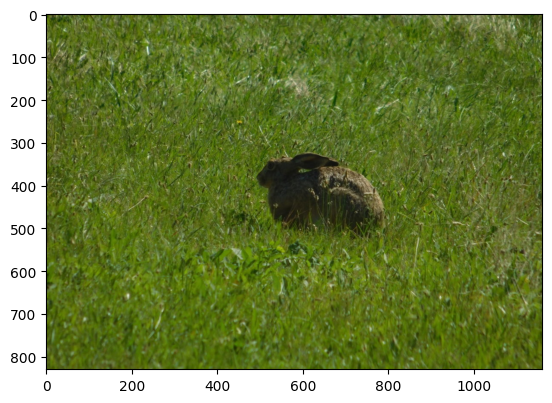

In [171]:
hare = cv2.imread('../data/Zajac_kolor.jpg')[..., ::-1]
plt.imshow(hare)

10


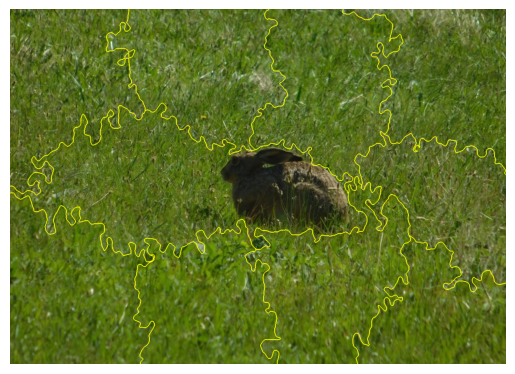

15


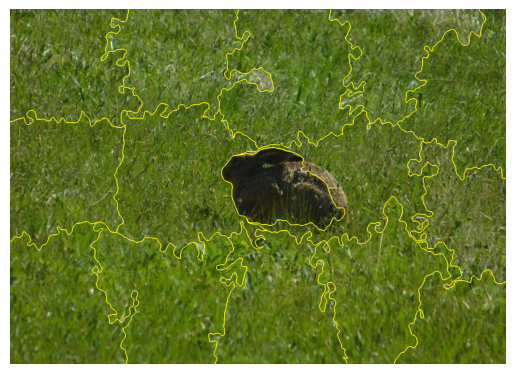

20


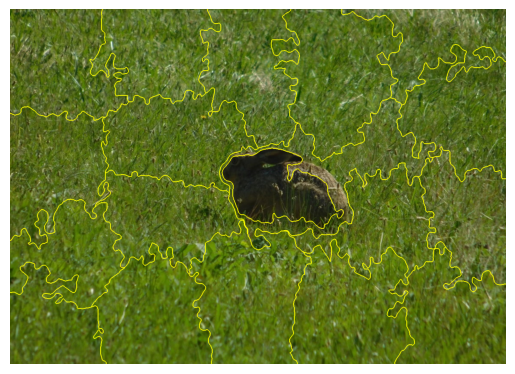

40


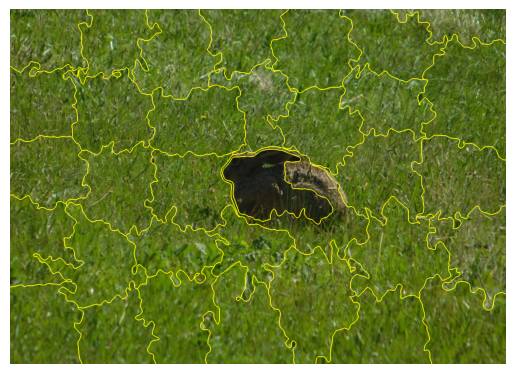

70


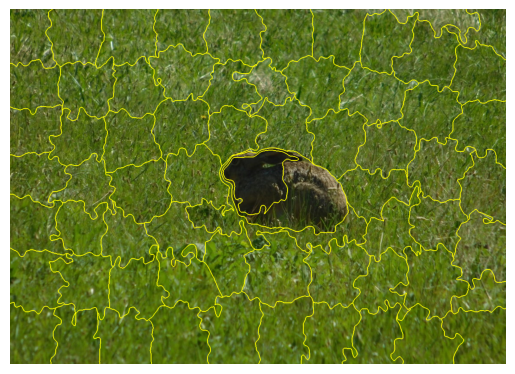

100


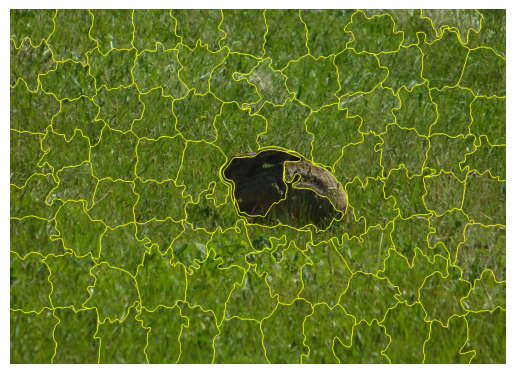

300


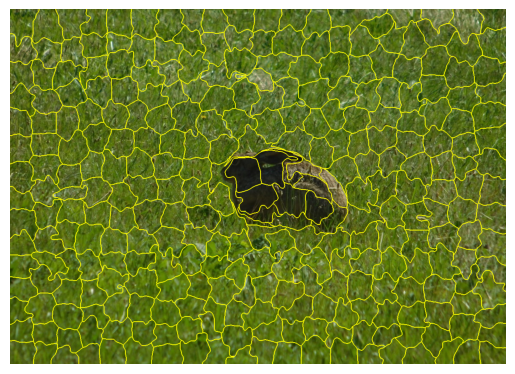

600


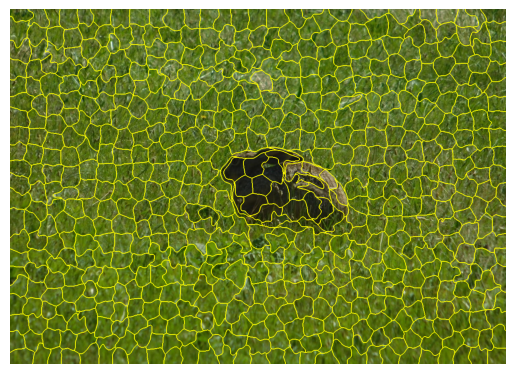

1000


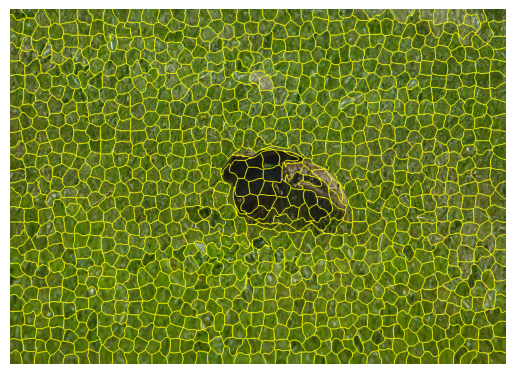

In [15]:
def slic_num_segments(img, segments=(10, 15, 20, 40, 70, 100, 300, 600, 1000)):
    for numSegments in segments:
        print(numSegments)
        segments = slic(img, n_segments=numSegments, sigma=5, start_label=1)
        img_tmp = mark_boundaries(img, segments)
        plt.imshow(img_tmp)
        plt.axis("off")
        plt.show()


slic_num_segments(hare)

In [26]:
import itertools

def slic_sigma(img, chain = itertools.chain(range(11), [20]), n_segments=70):
    for sigma in chain:
        print(sigma)
        segments = slic(img, n_segments=n_segments, sigma=sigma, start_label=1)
        img_tmp = mark_boundaries(img, segments)
        plt.imshow(img_tmp)
        plt.axis("off")
        plt.show()

0


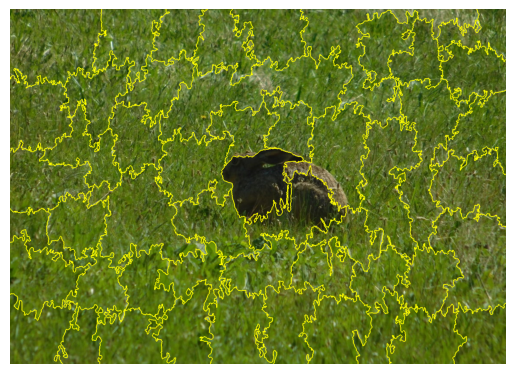

1


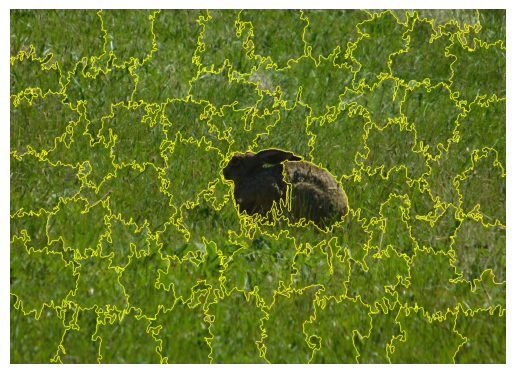

2


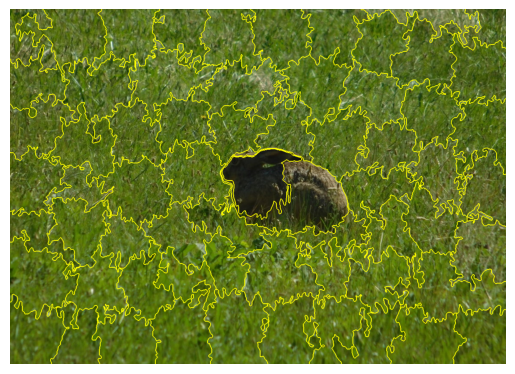

3


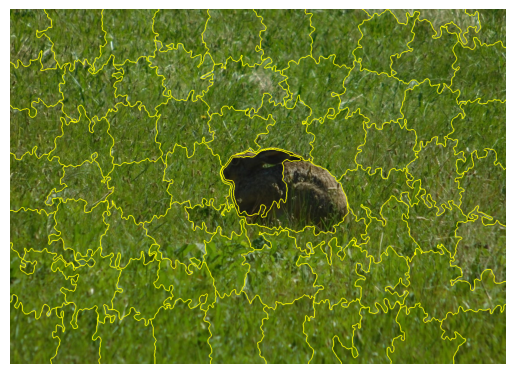

4


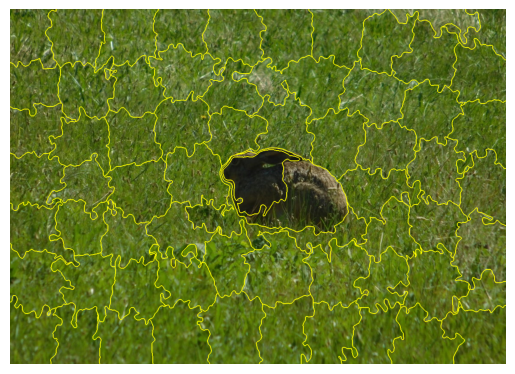

5


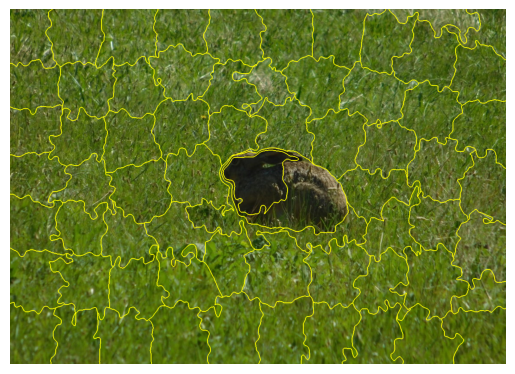

6


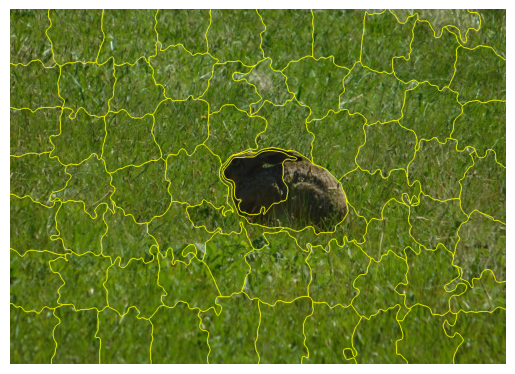

7


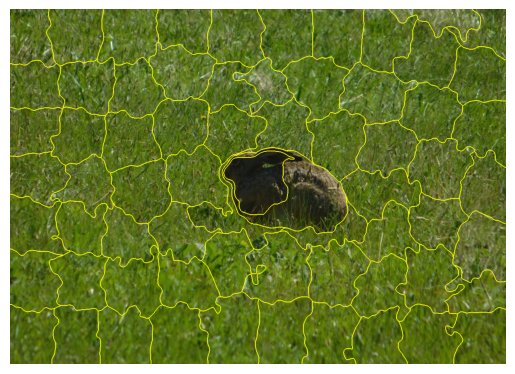

8


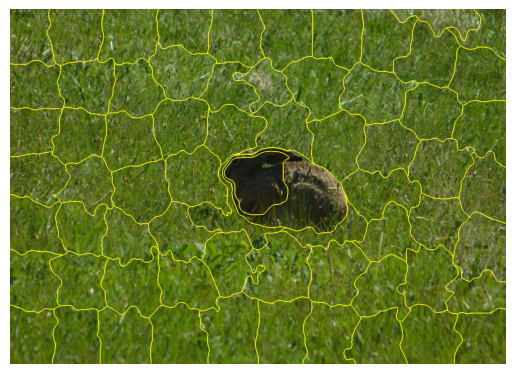

9


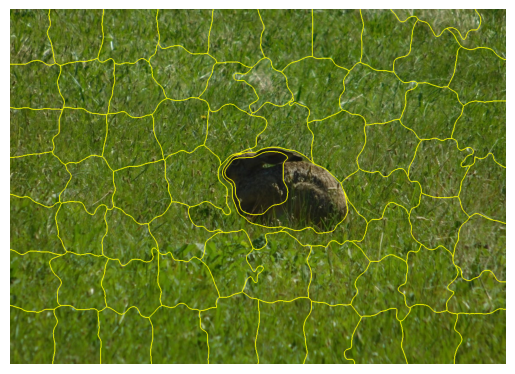

10


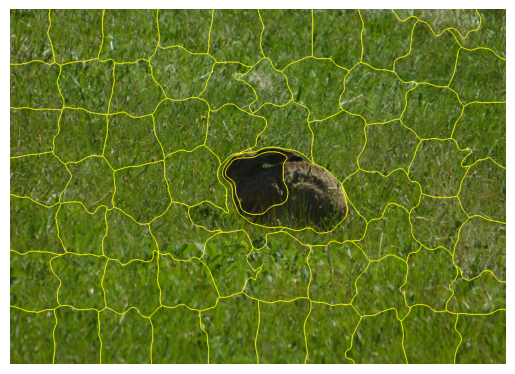

20


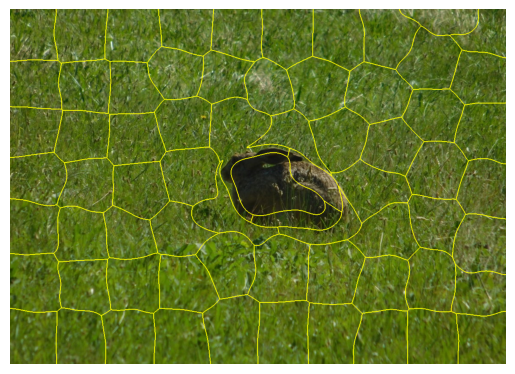

In [14]:
slic_sigma(hare)

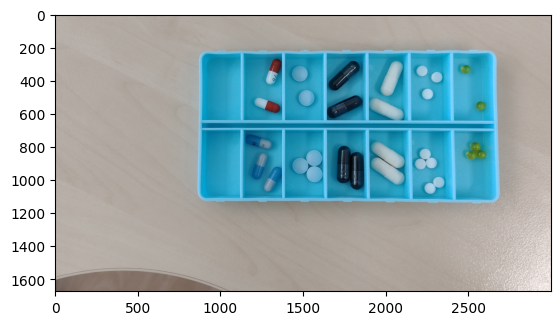

In [16]:
pills = cv2.imread('../data/pills.png')[..., ::-1]
plt.imshow(pills);

segments
10


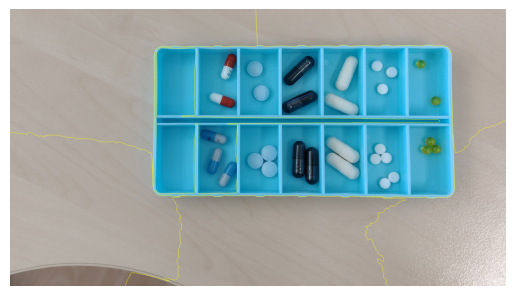

15


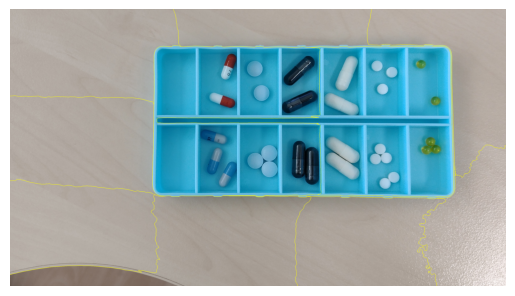

20


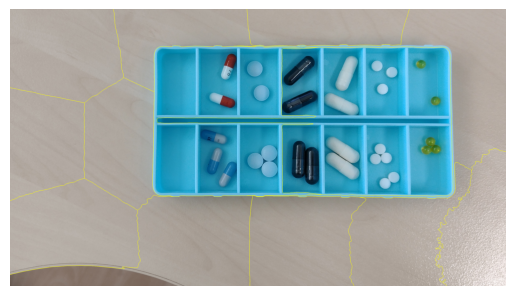

40


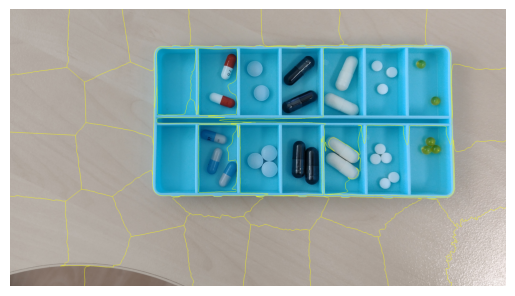

70


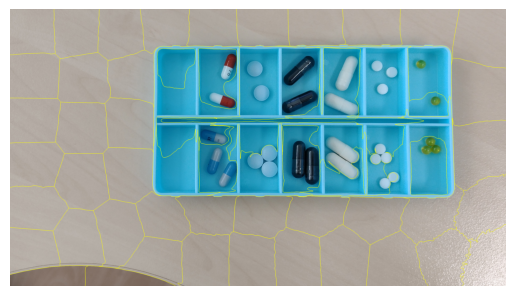

100


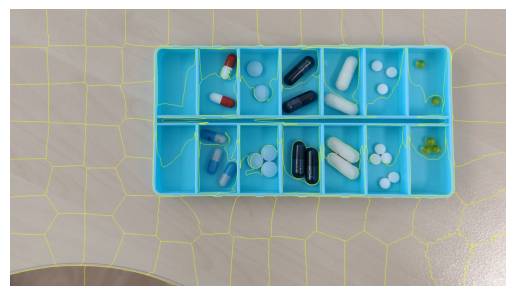

300


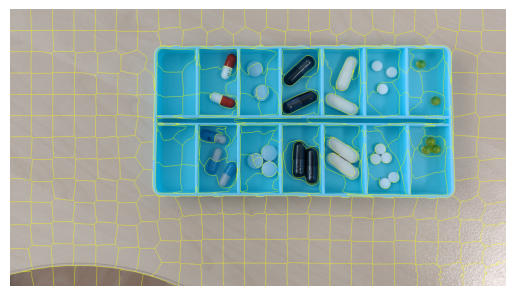

600


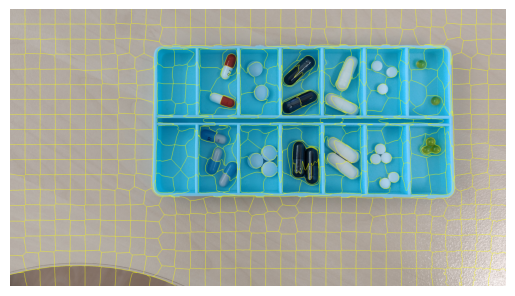

1000


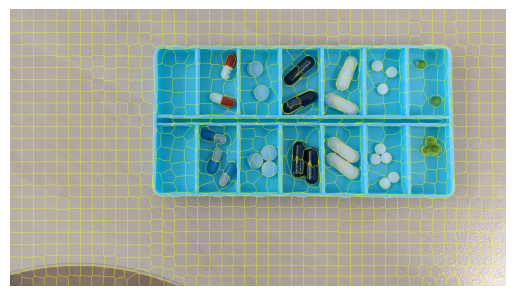

In [20]:
print('segments')
slic_num_segments(pills)

sigma
0


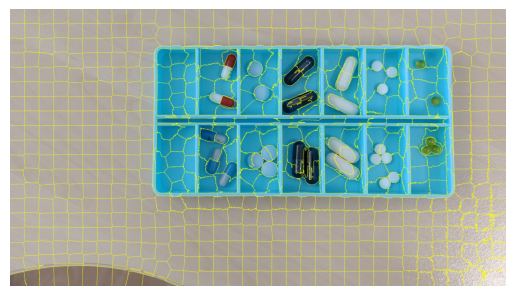

1


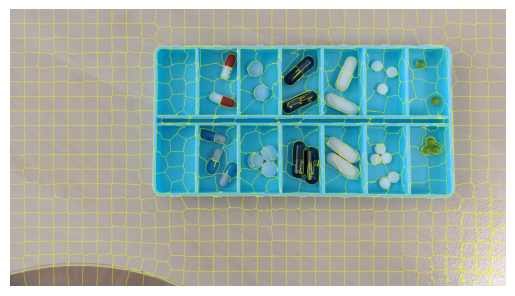

2


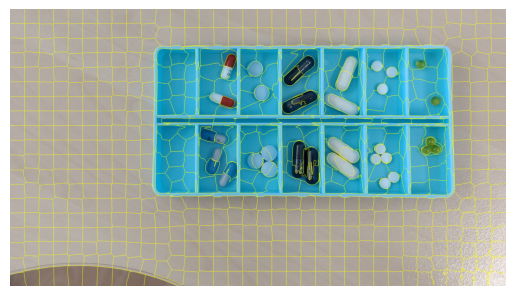

3


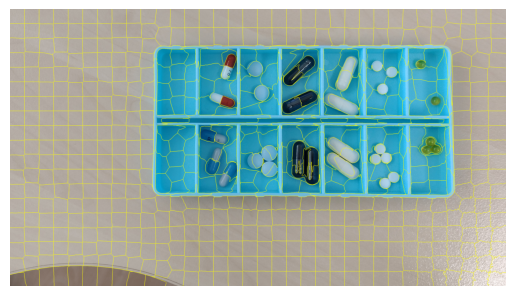

4


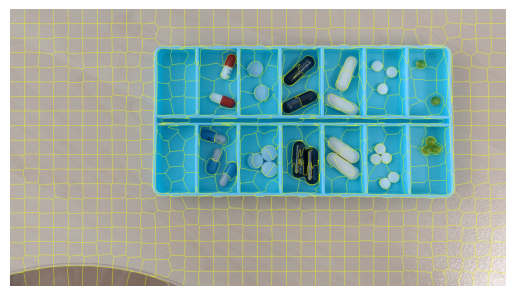

5


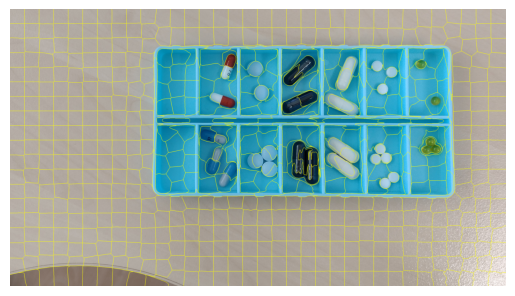

6


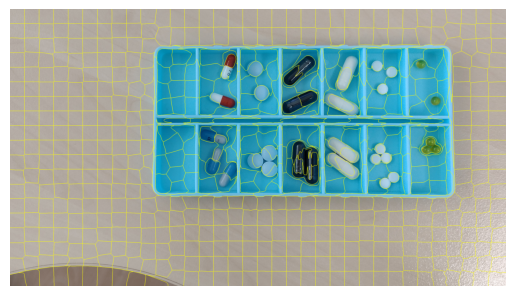

7


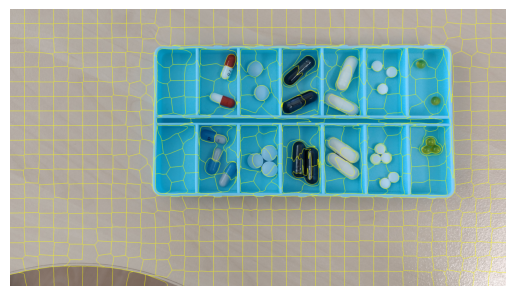

8


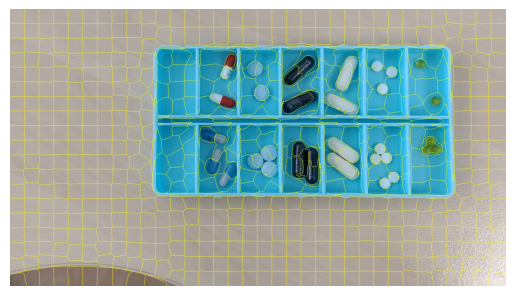

9


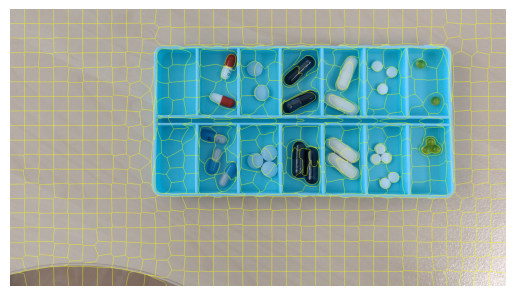

10


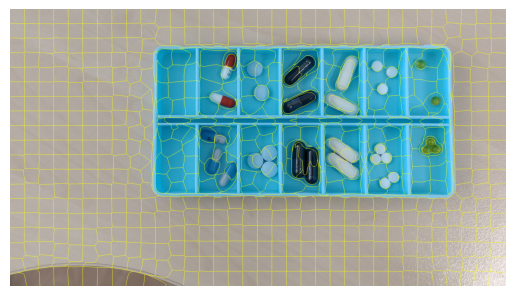

20


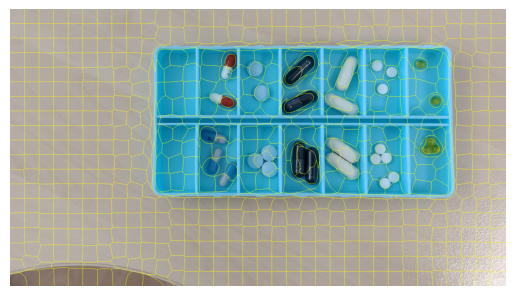

In [27]:
print('sigma')
slic_sigma(pills, n_segments=650)

#### Zadanie 2

Dla obrazu `hare` wykonaj post-processing segmentacji SLIC by uzyskać dwa jednorodne obszary: jeden zawierający wyłącznie zająca, drugi zawierający wyłącznie trawę. Wykorzystaj dowolny algorytm klasteryzacji (np. `cv2.kmeans`) używając *cech* superpikseli uzyskanych w zadaniu 1 jako danych wejściowych. Najprostszymi cechami, którymi można opisać superpiksele, są np. średnie wartości składowych barwy (pikseli, z których składa się superpiksel) - od nich zacznij. Zawsze możesz rozszerzyć rozwiązanie o bardziej wyrafinowane pomysły, jeśli starczy czasu.

Zaprezentuj wyniki najlepiej za pomocą `mark_boundaries` albo po prostu wyświetlając maskę binarną.

---

NumPy pro-tip: aby uzyskać zbiór wszystkich pikseli obrazu o wartości np. 3 możesz użyć notacji: ```obraz==3```. Wynikiem jest macierz boolowska, której można używać jako selektor. Np. aby na obrazie `A` wyzerować wszystkie piksele, którym w obrazie `B` odpowiada wartość 5, możesz napisać: ```A[B==5] = 0```. Ten zapis jest **znacznie** szybszy niż manualne iterowanie po obrazach i sprawdzanie warunków if-ami.

Przykładowe użycie `cv2.kmeans` (więcej możesz poczytać np. [tutaj](https://opencv24-python-tutorials.readthedocs.io/en/latest/py_tutorials/py_ml/py_kmeans/py_kmeans_opencv/py_kmeans_opencv.html)):
```python
c, labels, centers = cv2.kmeans(
    data=data,  # np.ndarray typu float o wymiarach NxK gdzie N to liczba sampli (u nas: superpikseli), K - liczba cech
    K=2,        # oczekiwana liczba klastrów
    bestLabels=None,
    criteria=(cv2.TERM_CRITERIA_EPS, 10, 1.0),  # przykładowe kryteria stopu
    attempts=1, # liczba powtórzeń algorytmu
    flags=cv2.KMEANS_RANDOM_CENTERS  # sposób inicjalizacji klastrów
)
```

Funkcja ta zwraca krotkę, której najważniejszym komponentem jest ten drugi (tu: `labels`), tj. macierz o wymiarach Nx1, zawierająca indeks klastra przypisanego i-temu samplowi.

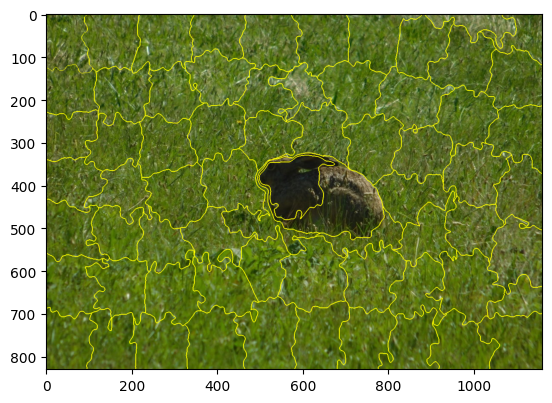

[[ 0  0  0 ...  9  9  9]
 [ 0  0  0 ...  9  9  9]
 [ 0  0  0 ...  9  9  9]
 ...
 [63 63 63 ... 66 66 66]
 [63 63 63 ... 66 66 66]
 [63 63 63 ... 66 66 66]]


In [129]:
# zacznij od przygotowania macierzy wejściowej (data) reprezentującej superpiksele jako punkty danych
n_segments = 70
segments = slic(hare, n_segments=n_segments, sigma=5, start_label=0)
img_tmp = mark_boundaries(hare, segments)
plt.imshow(img_tmp)
plt.show()
print(segments)

[ 7 11  0]
[245 255 245]


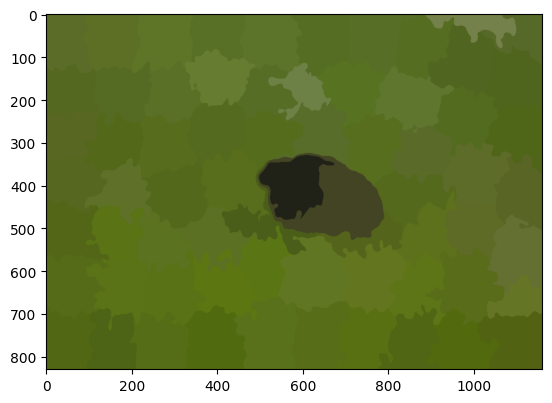

[ 0  0 11]
[165 255 255]


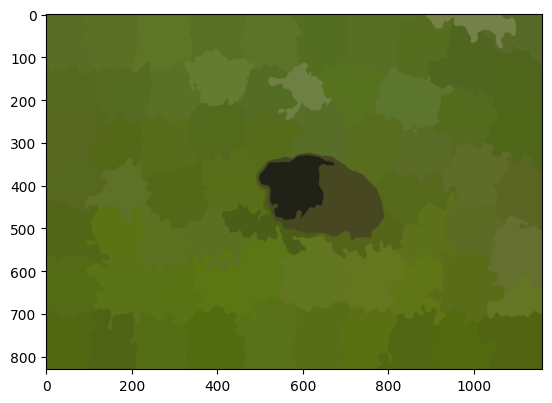

In [193]:
def count_superpixels_means(img, segments, is_hsv=False):
    print(np.min(img, axis=(0,1)))
    print(np.max(img, axis=(0,1)))
    superpixels_img = np.zeros_like(img, dtype='float32')
    sp = np.zeros((n_segments, 3), dtype='float32')
    for s in range(n_segments):
        indexes = np.where(segments == s)
        if np.size(indexes) != 0:
            s_mean = np.mean(img[indexes], axis=0)
            superpixels_img[indexes] = s_mean
            sp[s] = s_mean
    if is_hsv:
        superpixels_img = superpixels_img.astype('uint8')
        superpixels_img = cv2.cvtColor(superpixels_img, cv2.COLOR_HSV2RGB)
    plt.imshow(superpixels_img.astype('uint8'))
    plt.show()
    return sp

superpixels = count_superpixels_means(hare, segments)
superpixels_hsv = count_superpixels_means(hare_hsv, segments, is_hsv=True)


Możesz wykorzystać poniższy snippet by zredukować wynik segmentacji SLIC (`segments`) w oparciu o klasteryzację k-średnich (`labels`):

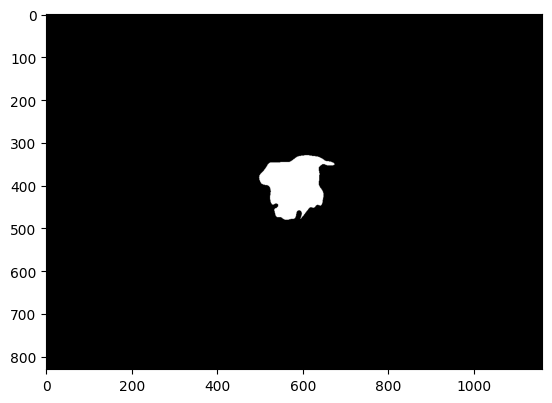

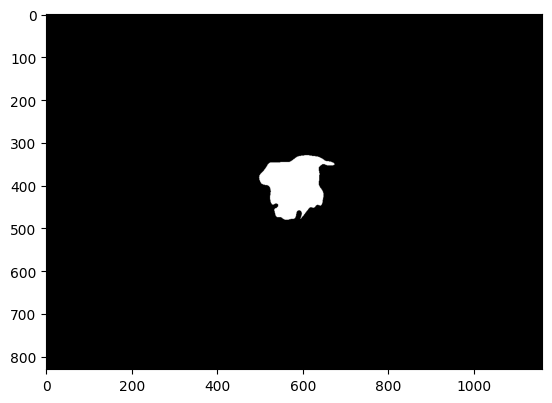

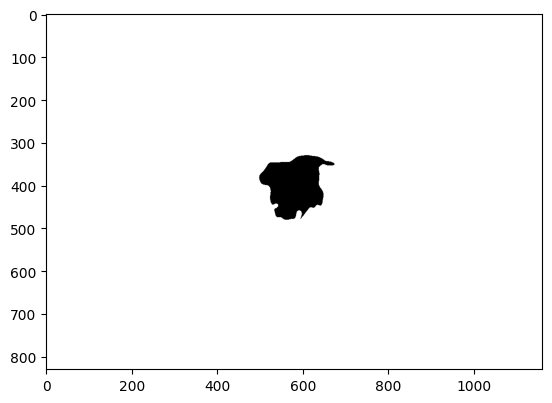

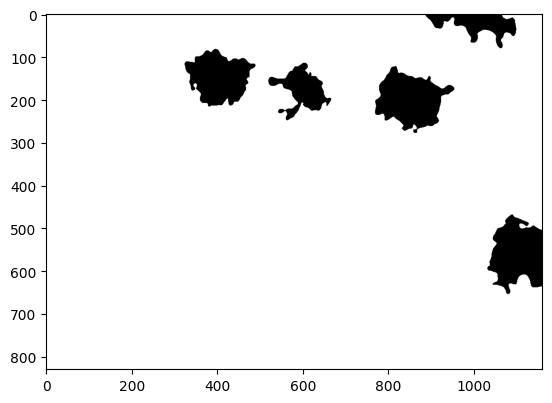

In [198]:
def cluster(data, K=2):
    c, labels, centers = cv2.kmeans(data=data, K=K, bestLabels=None, criteria=(cv2.TERM_CRITERIA_EPS, 10, 1.0),
                                    attempts=3, flags=cv2.KMEANS_RANDOM_CENTERS)
    postprocessed = np.zeros_like(segments)
    for i in range(labels.shape[0]):
        postprocessed[segments == i] = labels[i]  # jeśli używamy indeksowania od 0 w SLIC
    plt.imshow(postprocessed, 'gray')
    plt.show()


cluster(superpixels)
cluster(superpixels[...,0])
cluster(superpixels[...,1])
cluster(superpixels[...,2])

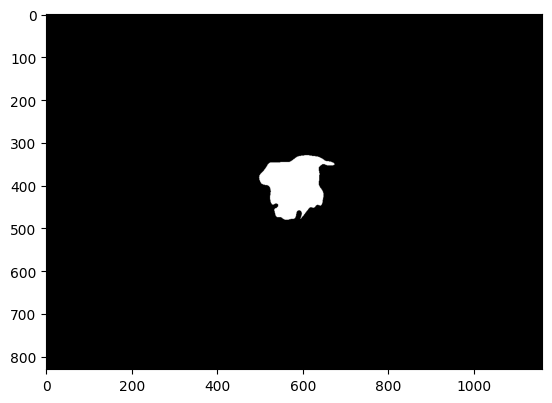

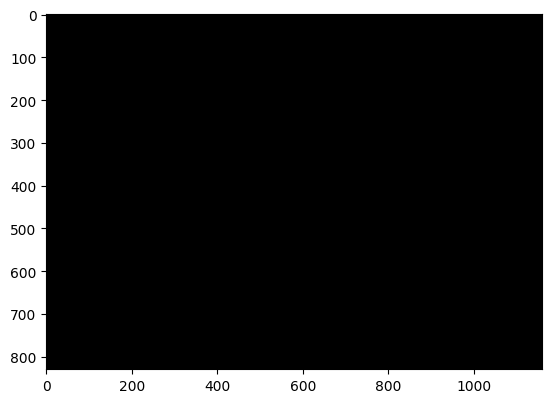

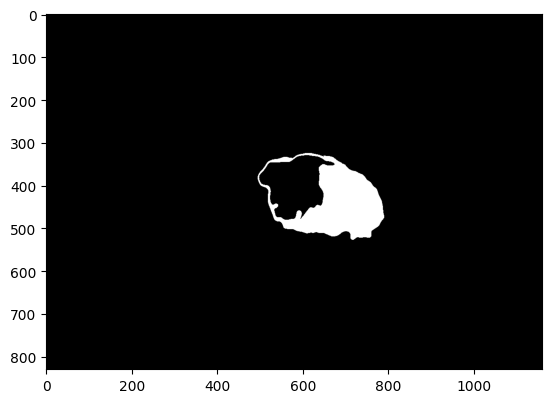

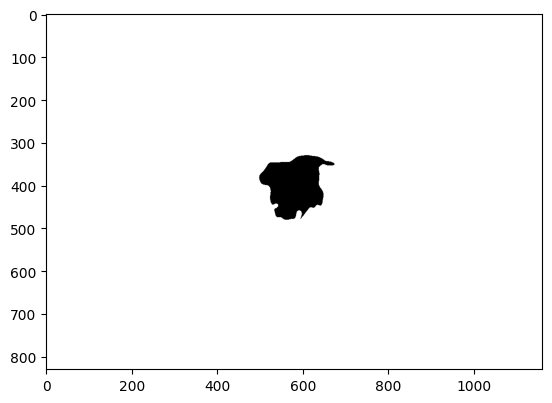

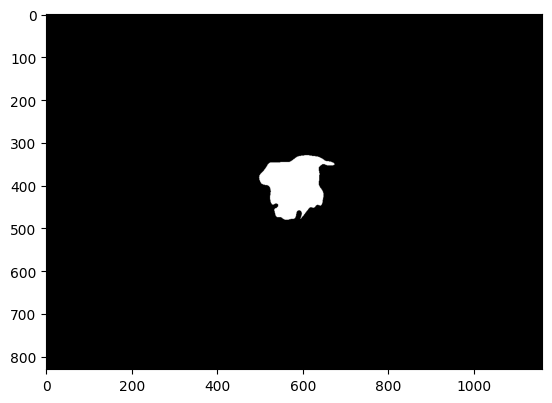

In [203]:
cluster(superpixels_hsv, K=2)
cluster(superpixels_hsv[...,0])
cluster(superpixels_hsv[...,0], K=3)
cluster(superpixels_hsv[...,1])
cluster(superpixels_hsv[...,2])